In [2]:
#!c1.8
%pip install pyyaml==5.1
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())

Defaulting to user installation because normal site-packages is not writeable
1.8.0 False


In [3]:
#!c1.8
import torch
assert torch.__version__.startswith("1.8")

In [4]:
#!c1.8
%pip install --upgrade 'git+https://github.com/facebookresearch/detectron2.git'

Defaulting to user installation because normal site-packages is not writeable
  Cloning https://github.com/facebookresearch/detectron2.git to /tmp/pip-req-build-5pcgq5ky
  Running command git clone -q https://github.com/facebookresearch/detectron2.git /tmp/pip-req-build-5pcgq5ky


In [5]:
#!c1.8
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

In [2046]:
#!g1.1
from detectron2.structures import Boxes

def onlykeep_person_class(outputs):
    cls = outputs['instances'].pred_classes
    scores = outputs["instances"].scores
    boxes = outputs['instances'].pred_boxes

    # index to keep whose class == 0
    indx_to_keep = (cls == 0).nonzero().flatten().tolist()

    # only keeping index  corresponding arrays
    cls1 = torch.tensor(np.take(cls.cpu().numpy(), indx_to_keep))
    scores1 = torch.tensor(np.take(scores.cpu().numpy(), indx_to_keep))
    boxes1 = Boxes(torch.tensor(np.take(boxes.tensor.cpu().numpy(), indx_to_keep, axis=0)))

    # create new instance obj and set its fields
    obj = detectron2.structures.Instances(image_size=(im.shape[0], im.shape[1]))
    obj.set('pred_classes', cls1)
    obj.set('scores', scores1)
    obj.set('pred_boxes',boxes1)
    return obj

In [2045]:
#!g1.1
cfg = get_cfg()
# add project-specific config (e.g., TensorMask) here if you're not running a model in detectron2's core library
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.6  # set threshold for this model
# Find a model from detectron2's model zoo. You can use the https://dl.fbaipublicfiles... url as well
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")
predictor = DefaultPredictor(cfg)

In [8]:
#!g1.1
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from PIL import Image
from io import BytesIO
import operator
import cv2
import urllib.request

from scipy.spatial import distance
import requests
from scipy.fftpack import fft, dct

from tqdm.notebook import tqdm
from ipywidgets import IntProgress
from tqdm import tqdm

import codecs, json 
import pprint
import collections

import pickle
import re
import time

import warnings
warnings.filterwarnings("ignore")

In [9]:
#!g1.1
def distances(x, y):
    return distance.hamming(x, y)

In [10]:
#!g1.1
def DCT_quantization(imgs):
    
    DCTs = []

    for img in imgs:
        
        try:
        
            DCT = dct(img, type=2, norm='ortho')

            DCTs.append(quantization(DCT))
        
        except:
            
            DCTs.append(None)
        
    return np.array(DCTs).flatten()

In [11]:
#!g1.1
def crop(link):
    
    imgs = []
    
    im = Image.open(BytesIO(requests.get(link).content)).resize((320,320)).convert('L')
    
    for i in range(40):
        for j in range(40):
            
            im1 = im.crop((8*j, 8*i, 8*(j+1), 8*(i+1)))
        
            imgs.append(im1)
            #print(dct(im1, type=2, norm='ortho').shape)
            
    return imgs

In [12]:
#!g1.1
def crop2(path):
    
    imgs = []
    
    im = Image.open(path).resize((320,320))
    
    for i in range(40):
        for j in range(40):
            
            im1 = im.crop((8*j, 8*i, 8*(j+1), 8*(i+1)))
        
            imgs.append(im1)
            #print(dct(im1, type=2, norm='ortho').shape)
            
    return imgs

In [13]:
#!g1.1
def quantization(matrix):
    
    matrix_of_quantization = np.array([
        [3,2,2,3,5,6,10,12],
        [2,2,3,4,5,12,12,11],
        [3,3,3,5,8,11,14,11],
        [3,3,4,6,10,17,16,12],
        [4,4,7,11,14,22,21,15],
        [5,7,11,13,16,21,23,18],
        [10,13,16,17,21,24,24,20],
        [14,18,19,20,22,20,21,20]
    ])
    
    result = np.array(matrix / matrix_of_quantization)
    
    res = result.mean() - result[0][0]/result.mean()
    
    result[result>=res] = 1
    result[(result<res) & (result!=1)] = 0

    
    return result

In [14]:
#!g1.1
def url_to_image(url):

    resp = urllib.request.urlopen(url)
    image = np.asarray(bytearray(resp.read()), dtype="uint8")
    image = cv2.imdecode(image, cv2.IMREAD_COLOR)
    image = cv2.cvtColor(image , cv2.COLOR_BGR2RGB)
    # return the image
    return image

In [2019]:
#!c1.8
URL = 'https://api.ratengoods.com/api/v0.10/image/'

In [2020]:
#!c1.8
data = pd.read_csv('data.csv')
data.key = data.key.astype(str)
data.prod_id = data.prod_id.astype(int)
data['links'] = URL + data.key
data.drop(columns=['Unnamed: 0'], inplace=True)
data = data.drop_duplicates(subset=['key'])
data

,key,name,source,prod_id,free_use,main,links
0,8732978,e214c0de5ab3134d7a8f918155af56826fe2872f.jpeg,USER,9489403,True,False,https://api.ratengoods.com/api/v0.10/image/873...
1,8722550,f010addceda8b3f61c2058023cba3aa3e4ff9842.jpeg,USER,2015371,True,False,https://api.ratengoods.com/api/v0.10/image/872...
2,8746670,0d378faeca33719cc5d2590a8ae0c018cd509885.jpeg,USER,8241001,True,False,https://api.ratengoods.com/api/v0.10/image/874...
3,8659332,a73d8495b5ccf2ce690690c3efad6739a8810b06.jpeg,USER,633711,True,False,https://api.ratengoods.com/api/v0.10/image/865...
4,8920811,36fa2a9a9dab9568ffc8de3a7c255ec0a6e8b28f.jpeg,USER,6633365,True,False,https://api.ratengoods.com/api/v0.10/image/892...
...,...,...,...,...,...,...,...
12090813,31004306,47d272e7e025e33607bbdaa273fef958bf92d001.jpeg,USER,30365191,True,False,https://api.ratengoods.com/api/v0.10/image/310...
12090818,31004330,0fc3cd11884fd21a0075816e1594a4b9a224c970.jpeg,USER,29378865,True,False,https://api.ratengoods.com/api/v0.10/image/310...
12090829,31004336,20fd2772c6f25da8f8ee7ffa6e239acbd9515201.jpeg,USER,30821390,True,False,https://api.ratengoods.com/api/v0.10/image/310...
12090835,31004342,b4d236191d1d574e2d29f38d3e22072815901d80.jpeg,USER,30821399,True,False,https://api.ratengoods.com/api/v0.10/image/310...


In [232]:
#!M
ids = [2035578,
236751,
2039041,
240099,
6092452,
8575738,
8100475,
3463064,
2035577,
8393179,
3240171,
240103,
12229855,
6280108,
1393840,
8672706,
2035654,
237130,
9274114,
1931759,
3741323,
240256,
2039125,
6311154,
1374413,
25378508,
3601824,
956780,
5969594,
2278831,
2270903,
96669,
2827084,
8100094,
240233,
6306467,
2412168,
2446737,
570163,
5979951,
1402036,
2985767,
1393899,
8102689,
8100319,
2799982,
2800091,
2956251,
9085622,
726456,
3080067,
3239963,
1293961,
24913567,
3083685,
9823489,
2800086,
8577273,
8381201,
239889,
3904450,
9842899,
236600,
8100058,
1394500,
6280118,
8100085,
24943151,
672779,
960669,
2417047,
8366748,
1394502,
24509431,
8100001,
1044884,
5979669,
579297,
8100741,
1931290,
2182608,
2850668,
26975648,
6167112,
3771629,
23812916,
948513,
2205202,
1212481,
4002215,
2437030,
2035601,
6316005,
3771627,
6276368,
29061953,
8102695,
2035674,
2800107,
8393458,
8102692,
1336919,
1931761,
6305313,
944675,
1274878,
8100314,
918751,
1294140,
8728690,
2536726,
2035712,
8100775,
8368044,
2035023,
8101303,
24956459,
25454491,
3166268,
2956245,
1393862,
3098491,
2192344,
2863813,
630529,
3083687,
8100445,
3168332,
1977270,
9725515,
8375005,
29133812,
8225638,
240520,
630448,
240109,
8100871,
26977923,
948523,
6305241,
2450391,
2363188,
2736351,
970582,
23772966,
3083802,
27244902,
24659701,
8101950,
240318,
910399,
6070426,
8100102,
678971,
2449140,
2165358,
8103913,
6305236,
25576094,
4253713,
239857,
5914358,
931076,
1336918,
678969,
931215,
9937598,
8101235,
8101124,
8248881,
81126,
8100097,
2722373,
1394501,
630889,
945644,
23821250,
3334475,
3168356,
681108,
25565200,
8102691,
240326,
8082710,
8243234,
6311157,
1424905,
954688,
1336917,
26790791,
9766630,
8615787,
6167093,
9276112,
5969588,
8209265,
2036936,
862210,
579289,
24939500]

In [16]:
#!g1.1
def decode(w):
    return np.array(list((format(w, 'b')))).astype(int)

In [ ]:
#!M


In [1339]:
#!M
data.source.unique()

array(['USER', 'RNG', 'korus', 'GS1', 'MANUFACTURER', 'ROSCONTROL',
       'roskachectvo', 'brandquad_nestle', 'ROSKACHESTVO', 'roskontrol',
       'admitad_citylink', 'admitad_mvideo', 'admitad_bethoven',
       'admitad_kotofoto', 'brandquad_loreal', 'admitad_utkonos',
       'admitad_santechnika_tut_ru', 'admitad_bukvoed',
       'admitad_220_volt', 'admitad_apteka_dialog', 'admitad_clever',
       'admitad_tvoy_dom', 'epn_decatlon', 'epn_metro',
       'admitad_loreal_paris', 'admitad_lit_res', 'admitad_eldoradoru',
       'brandquad_danone', 'admitad_obi', 'national_catalog'],
      dtype=object)

In [2021]:
#!c1.8
data.key = data.key.astype(int)
data

,key,name,source,prod_id,free_use,main,links
0,8732978,e214c0de5ab3134d7a8f918155af56826fe2872f.jpeg,USER,9489403,True,False,https://api.ratengoods.com/api/v0.10/image/873...
1,8722550,f010addceda8b3f61c2058023cba3aa3e4ff9842.jpeg,USER,2015371,True,False,https://api.ratengoods.com/api/v0.10/image/872...
2,8746670,0d378faeca33719cc5d2590a8ae0c018cd509885.jpeg,USER,8241001,True,False,https://api.ratengoods.com/api/v0.10/image/874...
3,8659332,a73d8495b5ccf2ce690690c3efad6739a8810b06.jpeg,USER,633711,True,False,https://api.ratengoods.com/api/v0.10/image/865...
4,8920811,36fa2a9a9dab9568ffc8de3a7c255ec0a6e8b28f.jpeg,USER,6633365,True,False,https://api.ratengoods.com/api/v0.10/image/892...
...,...,...,...,...,...,...,...
12090813,31004306,47d272e7e025e33607bbdaa273fef958bf92d001.jpeg,USER,30365191,True,False,https://api.ratengoods.com/api/v0.10/image/310...
12090818,31004330,0fc3cd11884fd21a0075816e1594a4b9a224c970.jpeg,USER,29378865,True,False,https://api.ratengoods.com/api/v0.10/image/310...
12090829,31004336,20fd2772c6f25da8f8ee7ffa6e239acbd9515201.jpeg,USER,30821390,True,False,https://api.ratengoods.com/api/v0.10/image/310...
12090835,31004342,b4d236191d1d574e2d29f38d3e22072815901d80.jpeg,USER,30821399,True,False,https://api.ratengoods.com/api/v0.10/image/310...


In [2022]:
#!c1.8
prod_ids = pd.DataFrame({'prod_id': data.groupby(['prod_id']).size().reset_index(name='count').sort_values('count', ascending=False).prod_id.values[200:300]})
prod_ids

,prod_id
0,8103734
1,9680135
2,8103312
3,28970040
4,631511
...,...
95,5959369
96,6284485
97,53156
98,726488


In [2023]:
#!c1.8
notUser = pd.merge(data, prod_ids, on='prod_id', how='inner')
notUser = notUser[((notUser.source != 'USER') & (notUser.source != 'RNG')) | ((notUser.source != 'USER') & (notUser.main == True))]
#notUser = notUser.drop_duplicates(subset=['prod_id'])
notUser = notUser.reset_index().drop(columns=['index'])
notUser

,key,name,source,prod_id,free_use,main,links
0,22545842,dbeeb267b8c481b7c41eacf3f16e55e5d6aeea56.jpeg,admitad_utkonos,8103296,False,False,https://api.ratengoods.com/api/v0.10/image/225...
1,2607097,34d9ab04e08bc3b1d3e4b7cf95137fa0c7dd0da1.jpeg,RNG,8103296,False,True,https://api.ratengoods.com/api/v0.10/image/260...
2,8778636,e4ebfd34b8340fb3d23a1b5083ebed70bac5b159.jpeg,korus,5959369,False,True,https://api.ratengoods.com/api/v0.10/image/877...
3,8778635,5d5b47de5209177ff7c47bee132b3bf29830a5e5.jpeg,korus,5959369,False,False,https://api.ratengoods.com/api/v0.10/image/877...
4,8932536,42c841be4ea9f55c1629c6f0897958405456197c.jpeg,korus,5959369,False,False,https://api.ratengoods.com/api/v0.10/image/893...
...,...,...,...,...,...,...,...
709,31058804,cb85baa6adca2964bc0250ab9389306d5da12399.png,brandquad_danone,30852148,False,False,https://api.ratengoods.com/api/v0.10/image/310...
710,31058809,a2fa75bbe1d846ca9aec99a46cb3d56853fbead5.png,brandquad_danone,30852148,False,False,https://api.ratengoods.com/api/v0.10/image/310...
711,31058801,5968040ac5af688105cf953f7ea981ef7ec76c85.png,brandquad_danone,30852148,False,False,https://api.ratengoods.com/api/v0.10/image/310...
712,31058802,3ceece588c365f0b307315e82f48ab9346aa62a7.png,brandquad_danone,30852148,False,False,https://api.ratengoods.com/api/v0.10/image/310...


In [2024]:
#!c1.8
User = pd.merge(data, pd.DataFrame({'prod_id': notUser.prod_id.unique()}), on='prod_id', how='inner')
User = User[User.source == "USER"]
User

,key,name,source,prod_id,free_use,main,links
1,8432700,ce2d6a0db80a79abb6aa234964cab51d1d8ccd34.jpeg,USER,8103296,True,False,https://api.ratengoods.com/api/v0.10/image/843...
2,8293113,37d1921e825fbfd2ac4e0383ec112452ee06d580.jpeg,USER,8103296,True,False,https://api.ratengoods.com/api/v0.10/image/829...
3,8686092,6b3fc8fc6dcaf0a76ff4d6624141e576dbbf95e3.jpeg,USER,8103296,True,False,https://api.ratengoods.com/api/v0.10/image/868...
4,8783186,c0ef57e0836f85c5de4fa9a9495ac994b259c4d3.jpeg,USER,8103296,True,False,https://api.ratengoods.com/api/v0.10/image/878...
5,8656028,113d6d399d113839e304057a7084bdc2b68e5512.png,USER,8103296,True,False,https://api.ratengoods.com/api/v0.10/image/865...
...,...,...,...,...,...,...,...
4234,20092742,56112212e8c71a35182e91bf8ff499259921581f.jpeg,USER,24913567,True,False,https://api.ratengoods.com/api/v0.10/image/200...
4235,24287335,75ce8271397317d3ab2bac78e75d9c2ba14305e3.jpeg,USER,24913567,True,False,https://api.ratengoods.com/api/v0.10/image/242...
4236,25890823,ae837ecab019b570b7c414658cbeb3eb4a475f90.jpeg,USER,24913567,True,False,https://api.ratengoods.com/api/v0.10/image/258...
4237,26122881,0f42dd0f915ad7fe2b21f1cadc5b5486baa6c75a.jpeg,USER,24913567,True,False,https://api.ratengoods.com/api/v0.10/image/261...


In [2025]:
#!c1.8
DCTs = []

for link in tqdm(notUser.links.values):
    try:
        DCTs.append(DCT_quantization(crop(link)))
    except Exception as exp:
        print(exp)
        DCTs.append(None)
        continue
    
notUser['DCT'] = DCTs

del DCTs

DCTs = []

for link in tqdm(User.links.values):
    try:
        DCTs.append(DCT_quantization(crop(link)))
    except Exception as exp:
        print(exp)
        DCTs.append(None)
        continue
        
User['DCT'] = DCTs

del DCTs

  1%|▏         | 9/714 [00:06<06:14,  1.88it/s]/kernel/lib/python3.7/site-packages/ml_kernel/kernel.py:16: RuntimeWarning: invalid value encountered in double_scalars
  import warnings
 69%|██████▉   | 494/714 [03:16<01:45,  2.08it/s]/kernel/lib/python3.7/site-packages/PIL/Image.py:963: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
100%|██████████| 3451/3451 [22:08<00:00,  2.60it/s]


In [2026]:
#!c1.8
notUser[notUser.DCT != None]

,key,name,source,prod_id,free_use,main,links,DCT
0,22545842,dbeeb267b8c481b7c41eacf3f16e55e5d6aeea56.jpeg,admitad_utkonos,8103296,False,False,https://api.ratengoods.com/api/v0.10/image/225...,"[1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, ..."
1,2607097,34d9ab04e08bc3b1d3e4b7cf95137fa0c7dd0da1.jpeg,RNG,8103296,False,True,https://api.ratengoods.com/api/v0.10/image/260...,"[1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, ..."
2,8778636,e4ebfd34b8340fb3d23a1b5083ebed70bac5b159.jpeg,korus,5959369,False,True,https://api.ratengoods.com/api/v0.10/image/877...,"[1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, ..."
3,8778635,5d5b47de5209177ff7c47bee132b3bf29830a5e5.jpeg,korus,5959369,False,False,https://api.ratengoods.com/api/v0.10/image/877...,"[1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, ..."
4,8932536,42c841be4ea9f55c1629c6f0897958405456197c.jpeg,korus,5959369,False,False,https://api.ratengoods.com/api/v0.10/image/893...,"[1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, ..."
...,...,...,...,...,...,...,...,...
709,31058804,cb85baa6adca2964bc0250ab9389306d5da12399.png,brandquad_danone,30852148,False,False,https://api.ratengoods.com/api/v0.10/image/310...,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
710,31058809,a2fa75bbe1d846ca9aec99a46cb3d56853fbead5.png,brandquad_danone,30852148,False,False,https://api.ratengoods.com/api/v0.10/image/310...,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
711,31058801,5968040ac5af688105cf953f7ea981ef7ec76c85.png,brandquad_danone,30852148,False,False,https://api.ratengoods.com/api/v0.10/image/310...,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
712,31058802,3ceece588c365f0b307315e82f48ab9346aa62a7.png,brandquad_danone,30852148,False,False,https://api.ratengoods.com/api/v0.10/image/310...,"[1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ..."


In [2027]:
#!c1.8
User[User.DCT != None]

,key,name,source,prod_id,free_use,main,links,DCT
1,8432700,ce2d6a0db80a79abb6aa234964cab51d1d8ccd34.jpeg,USER,8103296,True,False,https://api.ratengoods.com/api/v0.10/image/843...,"[1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, ..."
2,8293113,37d1921e825fbfd2ac4e0383ec112452ee06d580.jpeg,USER,8103296,True,False,https://api.ratengoods.com/api/v0.10/image/829...,"[1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, ..."
3,8686092,6b3fc8fc6dcaf0a76ff4d6624141e576dbbf95e3.jpeg,USER,8103296,True,False,https://api.ratengoods.com/api/v0.10/image/868...,"[1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ..."
4,8783186,c0ef57e0836f85c5de4fa9a9495ac994b259c4d3.jpeg,USER,8103296,True,False,https://api.ratengoods.com/api/v0.10/image/878...,"[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ..."
5,8656028,113d6d399d113839e304057a7084bdc2b68e5512.png,USER,8103296,True,False,https://api.ratengoods.com/api/v0.10/image/865...,"[1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, ..."
...,...,...,...,...,...,...,...,...
4234,20092742,56112212e8c71a35182e91bf8ff499259921581f.jpeg,USER,24913567,True,False,https://api.ratengoods.com/api/v0.10/image/200...,"[1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, ..."
4235,24287335,75ce8271397317d3ab2bac78e75d9c2ba14305e3.jpeg,USER,24913567,True,False,https://api.ratengoods.com/api/v0.10/image/242...,"[1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, ..."
4236,25890823,ae837ecab019b570b7c414658cbeb3eb4a475f90.jpeg,USER,24913567,True,False,https://api.ratengoods.com/api/v0.10/image/258...,"[1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, ..."
4237,26122881,0f42dd0f915ad7fe2b21f1cadc5b5486baa6c75a.jpeg,USER,24913567,True,False,https://api.ratengoods.com/api/v0.10/image/261...,"[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ..."


In [1513]:
#!g1.1
User.to_csv('User.csv')
notUser.to_csv('notUser.csv')

In [1933]:
#!g1.1
User = pd.read_csv('User.csv')
notUser = pd.read_csv('notUser.csv')

User.shape, notUser.shape

((4529, 9), (1528, 9))

In [2028]:
#!c1.8
from scipy.spatial.distance import pdist, jaccard, euclidean, cosine

In [1946]:
#!g1.1
User

,Unnamed: 0,key,name,source,prod_id,free_use,main,links,DCT
0,1,8432700,ce2d6a0db80a79abb6aa234964cab51d1d8ccd34.jpeg,USER,8103296,True,False,https://api.ratengoods.com/api/v0.10/image/843...,[1. 0. 0. ... 0. 0. 0.]
1,2,8293113,37d1921e825fbfd2ac4e0383ec112452ee06d580.jpeg,USER,8103296,True,False,https://api.ratengoods.com/api/v0.10/image/829...,[1. 0. 0. ... 0. 0. 0.]
2,3,8686092,6b3fc8fc6dcaf0a76ff4d6624141e576dbbf95e3.jpeg,USER,8103296,True,False,https://api.ratengoods.com/api/v0.10/image/868...,[1. 0. 1. ... 1. 1. 1.]
3,4,8783186,c0ef57e0836f85c5de4fa9a9495ac994b259c4d3.jpeg,USER,8103296,True,False,https://api.ratengoods.com/api/v0.10/image/878...,[1. 1. 1. ... 0. 0. 0.]
4,5,8656028,113d6d399d113839e304057a7084bdc2b68e5512.png,USER,8103296,True,False,https://api.ratengoods.com/api/v0.10/image/865...,[1. 1. 0. ... 1. 1. 1.]
...,...,...,...,...,...,...,...,...,...
4524,6484,8745323,d882dbe685e8ba7c444be3624f60a89b96a1b26f.jpeg,USER,6285408,True,False,https://api.ratengoods.com/api/v0.10/image/874...,[1. 1. 0. ... 0. 0. 0.]
4525,6485,1396667,3a8d9c50e2fe65b741482d8fa8fb66487aaa1318.jpeg,USER,6285408,True,False,https://api.ratengoods.com/api/v0.10/image/139...,[1. 0. 1. ... 0. 0. 0.]
4526,6486,1642245,93e766c1da1000a7f79105463fc9fd4fb07fe16c.jpeg,USER,6285408,True,False,https://api.ratengoods.com/api/v0.10/image/164...,[1. 0. 0. ... 1. 1. 1.]
4527,6487,9823921,10019cfc6295130cef942a06e2ad23dfafea8a50.jpeg,USER,6285408,True,False,https://api.ratengoods.com/api/v0.10/image/982...,[1. 0. 0. ... 0. 0. 0.]


In [2016]:
#!c1.8
distances([1,2,3,4], [2,3,4,5])

1.0

In [2017]:
#!c1.8
list(set([1,2,3,4]) & set([2,3,4,5]))

[2, 3, 4]

In [1960]:
#!c1.8
DCT1 = notUser[notUser.links == URL+str(22545842)].DCT.values[0]
DCT11 = np.asarray(Image.open(BytesIO(requests.get(URL+str(22545842)).content)).resize((320,320)).convert('L')).flatten()

DCT2 = User[User.key == 8745323].DCT.values[0]

key2 = User[User.key == 8745323].key.values[0]

print(1-distances(DCT1, DCT2))
print(jaccard(DCT1, DCT2))

DCT21 = np.asarray(Image.open(BytesIO(requests.get(URL+str(8745323)).content)).resize((320,320)).convert('L')).flatten()

print(euclidean(DCT11, DCT21))

print(cosine(DCT1, DCT2))

0.6503027343750001
0.657552609350325
46778.44878787667
0.4386089014418778


In [2030]:
#!g1.1
print(123)

123


In [2068]:
#!c1.8
import warnings
warnings.filterwarnings("ignore")

from math import sqrt

dist_hamming = {}
dist_jaccard = {}
dist_euclidean_whole1 = {}
dist_cos = {}

deleted = []

prods = notUser.prod_id.unique()

for prod_id in tqdm(prods):
    
    dist_hamming[prod_id] = {}
    dist_jaccard[prod_id] = {}
    dist_euclidean_whole1[prod_id] = {}
    dist_cos[prod_id] = {}
    
    if notUser[(notUser.prod_id == prod_id) & (notUser.main == True)].shape[0] == 0:
        links = notUser[notUser.prod_id == prod_id].links.values
    else:
        links = notUser[(notUser.prod_id == prod_id) & (notUser.main == True)].links.values
    
    for link1 in links:

        try:

            DCT1 = notUser[notUser.links == link1].DCT.values[0]
            key = notUser[notUser.links==link1].key.values[0]

            dist_hamming[prod_id][key] = {}
            dist_jaccard[prod_id][key] = {}
            dist_euclidean_whole1[prod_id][key] = {}
            dist_cos[prod_id][key] = {}

            DCT11 = np.asarray(Image.open(BytesIO(requests.get(link1).content)).resize((320,320)).convert('L')).flatten()

            data2 = User[User.prod_id == prod_id].links.values
            for link2 in (data2):
                
                if link2 not in deleted:

                    DCT2 = User[User.links == link2].DCT.values[0]

                    key2 = User[User.links == link2].key.values[0]

                    dist_hamming[prod_id][key][key2] = 1-distances(DCT1, DCT2)
                    dist_jaccard[prod_id][key][key2] = jaccard(DCT1, DCT2)

                    DCT21 = np.asarray(Image.open(BytesIO(requests.get(link2).content)).resize((320,320)).convert('L')).flatten()

                    dist_euclidean_whole1[prod_id][key][key2] = euclidean(DCT11, DCT21)

                    dist_cos[prod_id][key][key2] = cosine(DCT1, DCT2)

        except Exception as exp:
            print(exp)
            continue

100%|██████████| 93/93 [20:33<00:00, 13.26s/it]


In [1922]:
#!g1.1
deleted

['https://api.ratengoods.com/api/v0.10/image/8293113',
 'https://api.ratengoods.com/api/v0.10/image/8656028',
 'https://api.ratengoods.com/api/v0.10/image/9982609',
 'https://api.ratengoods.com/api/v0.10/image/17859488',
 'https://api.ratengoods.com/api/v0.10/image/8570518',
 'https://api.ratengoods.com/api/v0.10/image/8480171',
 'https://api.ratengoods.com/api/v0.10/image/2240050',
 'https://api.ratengoods.com/api/v0.10/image/8480170',
 'https://api.ratengoods.com/api/v0.10/image/8746309',
 'https://api.ratengoods.com/api/v0.10/image/8219209',
 'https://api.ratengoods.com/api/v0.10/image/8746310',
 'https://api.ratengoods.com/api/v0.10/image/148826',
 'https://api.ratengoods.com/api/v0.10/image/323729',
 'https://api.ratengoods.com/api/v0.10/image/1685712',
 'https://api.ratengoods.com/api/v0.10/image/8570516',
 'https://api.ratengoods.com/api/v0.10/image/8717318',
 'https://api.ratengoods.com/api/v0.10/image/8728941',
 'https://api.ratengoods.com/api/v0.10/image/23913157',
 'https://

In [2048]:
#!g1.1
with open('deleted.csv', 'w') as f:
    for x in deleted:
        f.write(x+'\n')

In [2094]:
#!c1.8
import warnings
warnings.filterwarnings("ignore")


best2_hamming = {}
best2_jaccard = {}
best2_euclidean_whole1 = {}
best2_cos = {}

for prod_id in tqdm(dist_hamming):
    
    best2_hamming[prod_id] = {}
    best2_jaccard[prod_id] = {}
    best2_euclidean_whole1[prod_id] = {}
    best2_cos[prod_id] = {}
    
    for key in dist_hamming[prod_id]:
    
        best2_hamming[prod_id][key] = {}
        d = collections.Counter(dist_hamming[prod_id][key])
        best2_hamming[prod_id][key] = d.most_common()[:1]

        best2_jaccard[prod_id][key] = {}
        d = collections.Counter(dist_jaccard[prod_id][key])
        best2_jaccard[prod_id][key] = d.most_common()[:2]

        best2_euclidean_whole1[prod_id][key] = {}
        d = collections.Counter(dist_euclidean_whole1[prod_id][key])
        best2_euclidean_whole1[prod_id][key] = d.most_common()[-2:]

        best2_cos[prod_id][key] = {}
        d = collections.Counter(dist_cos[prod_id][key])
        best2_cos[prod_id][key] = d.most_common()[-2:]

100%|██████████| 93/93 [00:02<00:00, 33.49it/s]


In [2095]:
#!c1.8
keys = []
for matrix in tqdm([best2_hamming, best2_jaccard, best2_euclidean_whole1, best2_cos]):
    for prod in matrix:
        for key in matrix[prod]:
            if key not in keys:
                keys.append(key)
len(keys)

100%|██████████| 4/4 [00:00<00:00, 2631.72it/s]


181

In [2096]:
#!c1.8
with open('links.txt', 'w') as f:
    for key in keys:
        f.write(str(key)+'\n')

In [2099]:
#!c1.8
hands = []
with open('hands2.txt', 'r') as f:
    for key in f:
        hands.append(int(key))
len(hands)

13

In [2100]:
#!c1.8
hands

[10006278,
 10453723,
 9151506,
 10232610,
 9979405,
 22386863,
 25896664,
 31057406,
 31057401,
 31056199,
 31057372,
 31058593,
 31058802]

In [2050]:
#!g1.1
def create_kont(link):
    image = url_to_image(link)
    
    image = cv2.resize(image, (320,320))

    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    gray = cv2.GaussianBlur(gray, (3, 3), 0)
    edged = cv2.Canny(gray, 10, 250)
    
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (7, 7))
    closed = cv2.morphologyEx(edged, cv2.MORPH_CLOSE, kernel)
    return closed

In [1023]:
#!M
import warnings
warnings.filterwarnings("ignore")

def im_to_array(link):
    return np.asarray(Image.open(BytesIO(requests.get(link).content)).convert('L').resize((320, 320)))

In [2101]:
#!c1.8
#from scipy.spatial import distance as ds

best = {}
best_metrix = [best2_hamming, best2_jaccard, best2_euclidean_whole1, best2_cos]
s = {}
best = {}

del_list = {}

for prod in tqdm(best2_hamming):
    s[prod] = {}
    best[prod] = {}
    
    del_list[prod] = {}
    
    for matrix in best_metrix:
        
        for key1 in matrix[prod]:
            
            array0 = create_kont(notUser[notUser.key == key1].links.values[0]).astype(int)/255
            cv2.imwrite("1.jpg", array0)
            DCT1 = DCT_quantization(crop2("1.jpg"))
            
            if key1 not in s[prod]:
                s[prod][key1] = {}
            
            for key2 in matrix[prod][key1]:

                if (key2[0] not in s[prod][key1]) and (key2[0] not in hands):
                    
                    link = URL + str(key2[0])
                    
                    #array2 = url_to_image(link)
                    #cv2.imwrite("2.jpg", array2)
                    #im = cv2.imread("2.jpg")
                    #original_outputs = predictor(im) #30 seconds(CPU) #1 seconds(GPU)
                    #modified_outputs = onlykeep_person_class(original_outputs)

                    #if modified_outputs.scores.sum() < 0.2:
                                        
                    array = create_kont(link).astype(int)/255
                    cv2.imwrite("3.jpg", array)
                    DCT2 = DCT_quantization(crop2("3.jpg"))

                    s[prod][key1][key2[0]] = 1-distances(DCT1, DCT2)
                    
    
    for k in s[prod]:
        best[int(prod)][int(k)] = list(collections.Counter(s[prod][k]).most_common()[:2])
        
import pickle

with open('best.pickle', 'wb') as handle:
    pickle.dump(best, handle, protocol=pickle.HIGHEST_PROTOCOL)
    
best

100%|██████████| 93/93 [08:10<00:00,  5.28s/it]


{8103296: {2607097: [(8243577, 0.912880859375), (8215935, 0.89478515625)]},
 5959369: {8778636: [(8911832, 0.62794921875), (8559923, 0.6232128906250001)]},
 8100749: {19105538: [(9254447, 0.834814453125), (1414610, 0.8299609375)]},
 6288557: {10024059: [(10242990, 0.8527148437500001),
   (1770057, 0.814345703125)]},
 9680135: {8129143: [(30230027, 0.6772265625), (155676, 0.6287109375)]},
 8102891: {10520834: [(621726, 0.850947265625), (1405507, 0.809697265625)]},
 8102880: {2605368: [(10050639, 0.87703125), (1405806, 0.85134765625)]},
 8103734: {8104287: [(8495644, 0.731962890625), (9710989, 0.728134765625)]},
 53901: {10005310: [(8744915, 0.841572265625), (8800300, 0.826474609375)]},
 6283529: {18688982: [(1089242, 0.5853515625), (8686415, 0.55666015625)],
  19222751: [(317489, 0.703408203125), (317493, 0.67328125)],
  19224420: [(317489, 0.712783203125), (8686415, 0.6864453125000001)],
  26090467: [(8686415, 0.693876953125), (317489, 0.68703125)]},
 945553: {8113476: [(8849622, 0.646

In [2084]:
#!c1.8
with open('best.pickle', 'rb') as handle:
    best = pickle.load(handle)
best

{8103296: {2607097: [(8243577, 0.912880859375), (8215935, 0.89478515625)]},
 5959369: {8778636: [(8911832, 0.62794921875), (8559923, 0.6232128906250001)]},
 8100749: {19105538: [(9254447, 0.834814453125), (1414610, 0.8299609375)]},
 6288557: {10024059: [(10242990, 0.8527148437500001),
   (1770057, 0.814345703125)]},
 9680135: {8129143: [(30230027, 0.6772265625), (155676, 0.6287109375)]},
 8102891: {10520834: [(621726, 0.850947265625), (1405507, 0.809697265625)]},
 8102880: {2605368: [(10050639, 0.87703125), (1405806, 0.85134765625)]},
 8103734: {8104287: [(8495644, 0.731962890625), (9710989, 0.728134765625)]},
 53901: {10005310: [(8744915, 0.841572265625), (8800300, 0.826474609375)]},
 6283529: {18688982: [(1089242, 0.5853515625), (8686415, 0.55666015625)],
  19222751: [(317489, 0.703408203125), (317493, 0.67328125)],
  19224420: [(317489, 0.712783203125), (8686415, 0.6864453125000001)],
  26090467: [(8686415, 0.693876953125), (317489, 0.68703125)]},
 945553: {8113476: [(8849622, 0.646

In [2102]:
#!c1.8
best2 = {}
best2 = best.copy()

for prod in tqdm(best):
    best2[prod] = best[prod].copy()
    for key1 in best[prod]:
        if len(best[prod][key1]) == 0:
            del best2[prod][key1] 
    if len(best2[prod]) == 0:
        del best2[prod]

100%|██████████| 93/93 [00:00<00:00, 231770.81it/s]


In [2103]:
#!c1.8
besrt22 = {}
best22 = best2.copy()

for prod in tqdm(best2):
    for key1 in best2[prod]:
        if len(best2[prod][key1])>1:
            try:
                diff = best2[prod][key1][0][1]
                if len(best22[prod][key1]) == 2:
                    best22[prod][key1].append(diff)
                else:
                    best22[prod][key1][2] = diff
            except Exception as exp:
                print(exp, '----')
                del best22[prod][key1]
                continue
        else:
            try:
                best22[prod][key1].append(best22[prod][key1][0][1])
            except Exception as exp:
                print(exp)
                del best22[prod][key1]
                continue

100%|██████████| 88/88 [00:00<00:00, 103796.05it/s]


In [2104]:
#!c1.8
best3 = {}
k = 0
for prod in tqdm(best22):
    best3[prod] = {}
    k = 0
    for key1 in best22[prod]:
        if len(best22[prod][key1]) > 2:
            if best22[prod][key1][2] > k:
                key = key1
                k = best22[prod][key1][2]
        else:
            if best22[prod][key1][1] > k:
                key = key1
                k = best22[prod][key1][1]
    best3[prod][key] = best22[prod][key1].copy()

100%|██████████| 88/88 [00:00<00:00, 180312.04it/s]


In [2105]:
#!c1.8
with open('best2.pickle', 'wb') as handle:
    pickle.dump(best3, handle, protocol=pickle.HIGHEST_PROTOCOL)

In [1997]:
#!c1.8
with open('best2.pickle', 'rb') as handle:
    best3 = pickle.load(handle)

In [2106]:
#!c1.8
best_best = {}

for prod_id in tqdm(best3):
    
    best_best[prod_id] = {}
    
    for key in best3[prod_id]:
        
        if (len(best3[prod_id][key])>2) and (int(best3[prod_id][key][0][1]*10) >= 8) and (abs(best3[prod_id][key][0][1] - best3[prod_id][key][1][1]) < 0.2):
            best_best[prod_id][key] = best3[prod_id][key].copy()
            
        elif (len(best3[prod_id][key])>2) and (int(best3[prod_id][key][0][1]*100) >= 65) and (abs(best3[prod_id][key][0][1] - best3[prod_id][key][1][1]) < 0.1):
            best_best[prod_id][key] = best3[prod_id][key].copy()
            
        elif (len(best3[prod_id][key])>2) and (int(best3[prod_id][key][0][1]*100) >= 65) and (abs(best3[prod_id][key][0][1] - best3[prod_id][key][1][1]) > 0.1):
            best_best[prod_id][key] = [best3[prod_id][key][0]]
            
        else:
            if (len(best3[prod_id][key]) != 0) and (int(best3[prod_id][key][0][1]*100) >= 65): 
                best_best[prod_id][key] = best3[prod_id][key].copy()
            
        if (len(best3[prod_id][key])>2) and (int(best3[prod_id][key][0][1]*10) >= 9) and (abs(best3[prod_id][key][0][1] - best3[prod_id][key][1][1]) > 0.02):
            best_best[prod_id][key] = [best3[prod_id][key][0]]
            
        if (len(best3[prod_id][key])>2) and (int(best3[prod_id][key][0][1]*10) >= 9) and (abs(best3[prod_id][key][0][1] - best3[prod_id][key][1][1]) < 0.02):
            best_best[prod_id][key] = best3[prod_id][key].copy()

100%|██████████| 88/88 [00:00<00:00, 114591.35it/s]


In [1999]:
#!M
len(best_best)

143

In [2115]:
#!c1.8
linkss = []
with open('hands3.txt', 'r') as f:
    for link in f:
        linkss.append(link[:-1])
len(linkss)

35

In [2118]:
#!c1.8
import warnings
warnings.filterwarnings("ignore")

User_links = []

for prod_id in tqdm(best_best):
    
    k = []
    
    if len(best_best[prod_id]) > 0:
    
        for key_notUser in best_best[prod_id]:

            if len(best_best[prod_id][key_notUser]) > 2:
                if (URL+str(best_best[prod_id][key_notUser][0][0])) not in linkss:
                    k.append([URL+str(best_best[prod_id][key_notUser][0][0]), best_best[prod_id][key_notUser][0][1]])
                if (URL+str(best_best[prod_id][key_notUser][1][0])) not in linkss:
                    k.append([URL+str(best_best[prod_id][key_notUser][1][0]), best_best[prod_id][key_notUser][1][1]])
            else:
                if len(best_best[prod_id][key_notUser]) > 0:
                    if (URL+str(best_best[prod_id][key_notUser][0][0])) not in linkss:
                        k.append([URL+str(best_best[prod_id][key_notUser][0][0]), best_best[prod_id][key_notUser][0][1]])
            
    #k.append([URL+str(best[prod_id][0]), best[prod_id][1]])

        User_links.append([prod_id, URL+str(key_notUser), k])

pp = pprint.PrettyPrinter()
pp.pprint(User_links)

100%|██████████| 88/88 [00:02<00:00, 40.28it/s]


[[8103296,
  'https://api.ratengoods.com/api/v0.10/image/2607097',
  [['https://api.ratengoods.com/api/v0.10/image/8243577', 0.912880859375],
   ['https://api.ratengoods.com/api/v0.10/image/8215935', 0.89478515625]]],
 [8100749,
  'https://api.ratengoods.com/api/v0.10/image/19105538',
  [['https://api.ratengoods.com/api/v0.10/image/9254447', 0.834814453125],
   ['https://api.ratengoods.com/api/v0.10/image/1414610', 0.8299609375]]],
 [6288557,
  'https://api.ratengoods.com/api/v0.10/image/10024059',
  [['https://api.ratengoods.com/api/v0.10/image/1770057', 0.814345703125]]],
 [9680135,
  'https://api.ratengoods.com/api/v0.10/image/8129143',
  [['https://api.ratengoods.com/api/v0.10/image/30230027', 0.6772265625],
   ['https://api.ratengoods.com/api/v0.10/image/155676', 0.6287109375]]],
 [8102891,
  'https://api.ratengoods.com/api/v0.10/image/10520834',
  [['https://api.ratengoods.com/api/v0.10/image/621726', 0.850947265625],
   ['https://api.ratengoods.com/api/v0.10/image/1405507', 0.80

In [2108]:
#!c1.8
len(User_links)

81

100%|██████████| 81/81 [00:59<00:00,  1.37it/s]


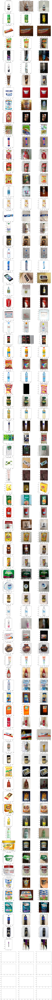

In [2120]:
#!c1.8
import warnings
warnings.filterwarnings("ignore")


l=len(User_links)
fig, axes = plt.subplots(nrows=l, ncols=3, squeeze=False)

i=0

for x in tqdm(User_links):
    
    prod_id = int(x[0])
    
    if len(x[2]) > 0:
        link0 = x[1]
        link2 = x[2][-1][0]
        distance_user2 = x[2][-1][1]

        if (len(x[2])==2) and (isinstance(x[2][-2][1], float)) :
            link3 = x[2][-2][0]
            distance_user3 = x[2][-2][1]
        else:
            link3 = link2
            distance_user3 = distance_user2

        array0 = url_to_image(link0)
        array2 = url_to_image(link2)
        array3 = url_to_image(link3)


        axes[i][0].imshow(array0)
        axes[i][0].set_title(f'Prod_id: {prod_id}')
        axes[i][1].imshow(array2)
        axes[i][1].set_title('ЛУЧШАЯ 1  Схожесть {0:.2f}'.format(distance_user2))
        axes[i][2].imshow(array3)
        axes[i][2].set_title('ЛУЧШАЯ 2  Схожесть {0:.2f}'.format(distance_user3))

        i+=1

fig.set_figwidth(20) 
fig.set_figheight(l*5) 

plt.show()

In [2121]:
#!c1.8
from matplotlib.backends.backend_pdf import PdfPages

pdf = PdfPages("prods.pdf")
pdf.savefig(fig)
pdf.close()

In [ ]:
#!c1.8


In [ ]:
#!c1.8


In [ ]:
#!c1.8


In [ ]:
#!c1.8


In [ ]:
#!c1.8


In [2110]:
#!c1.8
k = []
for y in User_links:
    k.append(y[2][0][0])
    if len(y[2])>1:
        k.append(y[2][1][0])
k

['https://api.ratengoods.com/api/v0.10/image/8243577',
 'https://api.ratengoods.com/api/v0.10/image/8215935',
 'https://api.ratengoods.com/api/v0.10/image/9254447',
 'https://api.ratengoods.com/api/v0.10/image/1414610',
 'https://api.ratengoods.com/api/v0.10/image/10242990',
 'https://api.ratengoods.com/api/v0.10/image/1770057',
 'https://api.ratengoods.com/api/v0.10/image/30230027',
 'https://api.ratengoods.com/api/v0.10/image/155676',
 'https://api.ratengoods.com/api/v0.10/image/621726',
 'https://api.ratengoods.com/api/v0.10/image/1405507',
 'https://api.ratengoods.com/api/v0.10/image/10050639',
 'https://api.ratengoods.com/api/v0.10/image/1405806',
 'https://api.ratengoods.com/api/v0.10/image/8495644',
 'https://api.ratengoods.com/api/v0.10/image/9710989',
 'https://api.ratengoods.com/api/v0.10/image/8744915',
 'https://api.ratengoods.com/api/v0.10/image/8800300',
 'https://api.ratengoods.com/api/v0.10/image/8686415',
 'https://api.ratengoods.com/api/v0.10/image/317489',
 'https://

In [2114]:
#!M
with open('hand_links.txt', 'w') as f:
    for link in tqdm(k):
        f.write(link+'\n')

100%|██████████| 156/156 [00:00<00:00, 316245.25it/s]


In [2066]:
#!g1.1
import warnings
warnings.filterwarnings("ignore")

def im_to_array(link):
    return np.asarray(Image.open(BytesIO(requests.get(link).content)))

In [1093]:
#!M
def create_kont(link):
    image = url_to_image(link)
    
    image = cv2.resize(image, (320,320))

    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    gray = cv2.GaussianBlur(gray, (3, 3), 0)
    edged = cv2.Canny(gray, 10, 250)
    
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (7, 7))
    closed = cv2.morphologyEx(edged, cv2.MORPH_CLOSE, kernel)
    return closed.flatten()

In [1217]:
#!M
link = 'https://api.ratengoods.com/api/v0.10/image/1410355' # путь к файлу с картинкой

image = url_to_image(link)

gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
gray = cv2.GaussianBlur(gray, (3, 3), 0)
edged = cv2.Canny(gray, 10, 250)
cv2.imwrite("edged.jpg", edged)

True

In [1218]:
#!M
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (7, 7))
closed = cv2.morphologyEx(edged, cv2.MORPH_CLOSE, kernel)
cv2.imwrite("closed.jpg", closed)

True

In [ ]:
#!M
cnts = cv2.findContours(closed.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)[1]
total = 0

In [ ]:
#!M


In [ ]:
#!M


In [2067]:
#!g1.1
array2 = im_to_array(URL+str(9779764))
cv2.imwrite("2.jpg", array2)
im = cv2.imread("2.jpg")
original_outputs = predictor(im) #30 seconds(CPU) #1 seconds(GPU)
modified_outputs = onlykeep_person_class(original_outputs)

y0, x0 = modified_outputs.image_size
y0, x0 = y0/2, x0/2

R = np.mean([modified_outputs.image_size[0], modified_outputs.image_size[1]])/8.3

k = modified_outputs.get_fields()['scores'].numpy()

if len(k) != 0:

    score = k.max()
    x, y = modified_outputs.get_fields()['pred_boxes'][list(modified_outputs.get_fields()['scores'].numpy()).index(score)].get_centers()[0].tolist()
    r = sqrt((x-x0)**2 + (y-y0)**2)
    
    print(r>R)
else:
    print('Net')

Net


In [ ]:
#!M


In [ ]:
#!M


In [ ]:
#!M
